In [1]:
from torch.utils.data import Dataset
from datasets import load_dataset

class CaptchaDataset(Dataset):
    def __init__(self, split='train'):
        self.data = load_dataset(
            "project-sloth/captcha-images", trust_remote_code=True)[split]

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]
        return {
            "image": sample["image"], # Should be a PIL image
            "qa": [
                {
                    "question": "Whats written in image.",
                    "answer": sample["solution"],
                }
            ]
        }

datasets = {
    "train": CaptchaDataset("train"),
    "test": CaptchaDataset("test"),
}

Now let's take a look at a sample image from the training set and compare the ground-truth answers
with moondream predictions.

In [2]:
# Initialize moondream. Change DEVICE to 'mps' if you're on an M1 Mac, or 'cpu' if you don't have a
# GPU. Note that fine-tuning on CPU will be very slow.

import torch
from transformers import AutoTokenizer, AutoModelForCausalLM

DEVICE = "cuda"
DTYPE = torch.float32 if DEVICE == "cpu" else torch.float16 # CPU doesn't support float16
MD_REVISION = "2024-08-26"

tokenizer = AutoTokenizer.from_pretrained("vikhyatk/moondream2", revision=MD_REVISION)
moondream = AutoModelForCausalLM.from_pretrained(
    "vikhyatk/moondream2", revision=MD_REVISION, trust_remote_code=True,
    attn_implementation="flash_attention_2" if DEVICE == "cuda" else None,
    torch_dtype=DTYPE, device_map={"": DEVICE}
)

PhiForCausalLM has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


In [3]:
with open("model_architecture.txt", "w") as f:
    f.write(str(moondream))


In [4]:
# Total parameters
print("moon_dream")
total_params = sum(p.numel() for p in moondream.parameters())
# Trainable (learnable) parameters
trainable_params = sum(p.numel() for p in moondream.parameters() if p.requires_grad)
# Non-trainable parameters
non_trainable_params = total_params - trainable_params

print(f"Total parameters: {total_params}")
print(f"Trainable parameters: {trainable_params}")
print(f"Non-trainable parameters: {non_trainable_params}")


moon_dream
Total parameters: 1867982709
Trainable parameters: 1867982709
Non-trainable parameters: 0


In [5]:
for param in moondream.parameters():
    param.requires_grad = False

print("All parameters in the model have been frozen.")


All parameters in the model have been frozen.


In [6]:
# Total parameters
print("moon_dream_frozen")
total_params = sum(p.numel() for p in moondream.parameters())
# Trainable (learnable) parameters
trainable_params = sum(p.numel() for p in moondream.parameters() if p.requires_grad)
# Non-trainable parameters
non_trainable_params = total_params - trainable_params

print(f"Total parameters: {total_params}")
print(f"Trainable parameters: {trainable_params}")
print(f"Non-trainable parameters: {non_trainable_params}")


moon_dream_frozen
Total parameters: 1867982709
Trainable parameters: 0
Non-trainable parameters: 1867982709


In [7]:
# Check the state dict of the vision encoder
print(moondream.vision_encoder.state_dict().keys())

odict_keys(['encoder.model.visual.pos_embed', 'encoder.model.visual.patch_embed.linear.weight', 'encoder.model.visual.patch_embed.linear.bias', 'encoder.model.visual.blocks.0.attn.qkv.weight', 'encoder.model.visual.blocks.0.attn.qkv.bias', 'encoder.model.visual.blocks.0.attn.proj.weight', 'encoder.model.visual.blocks.0.attn.proj.bias', 'encoder.model.visual.blocks.0.mlp.fc1.weight', 'encoder.model.visual.blocks.0.mlp.fc1.bias', 'encoder.model.visual.blocks.0.mlp.fc2.weight', 'encoder.model.visual.blocks.0.mlp.fc2.bias', 'encoder.model.visual.blocks.0.norm1.weight', 'encoder.model.visual.blocks.0.norm1.bias', 'encoder.model.visual.blocks.0.norm2.weight', 'encoder.model.visual.blocks.0.norm2.bias', 'encoder.model.visual.blocks.1.attn.qkv.weight', 'encoder.model.visual.blocks.1.attn.qkv.bias', 'encoder.model.visual.blocks.1.attn.proj.weight', 'encoder.model.visual.blocks.1.attn.proj.bias', 'encoder.model.visual.blocks.1.mlp.fc1.weight', 'encoder.model.visual.blocks.1.mlp.fc1.bias', 'encod

In [10]:
from peft import LoraConfig, get_peft_model

# Define LoRA config
lora_config = LoraConfig(
    r=8,                # Rank of the low-rank decomposition (can be adjusted)
    lora_alpha=32,      # Scaling factor for LoRA
    lora_dropout=0.1,   # Dropout rate for LoRA
    bias="none",        # Whether to include bias terms in the LoRA modification
    target_modules=["qkv", "proj"]  # Apply LoRA to these attention modules
)

# Apply LoRA to the vision encoder
model_with_lora_vision = get_peft_model(moondream.vision_encoder, lora_config)

# Apply LoRA to the text encoder
model_with_lora_text = get_peft_model(moondream.text_model.transformer.h, lora_config)  # `h` contains the PhiDecoderLayer

# Apply LoRA to the LLM (language model)
model_with_lora_llm = get_peft_model(moondream.text_model, lora_config)

# Update the original model with the LoRA-modified components
moondream_with_lora = moondream
moondream_with_lora.vision_encoder = model_with_lora_vision
moondream_with_lora.text_model.transformer.h = model_with_lora_text  # Update the decoder layers
moondream_with_lora.text_model = model_with_lora_llm  # Update the text model's LLM part

# Now moondream_with_lora should have LoRA applied to the specified modules


ValueError: Target modules {'proj', 'qkv'} not found in the base model. Please check the target modules and try again.

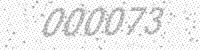

Question: Whats written in image.
Ground Truth: 000073
Moondream: The text in the center of the image says "0073".


In [12]:
from IPython.display import display

sample = datasets['train'][0]
display(sample['image'])

for qa in sample['qa']:
    print('Question:', qa['question'])
    print('Ground Truth:', qa['answer'])
    print('Moondream:', moondream.answer_question(
        moondream.encode_image(sample['image']),
        qa['question'],
        tokenizer=tokenizer,
    ))

Let's start setting up hyperparameters for finetuning.

In [ ]:
# Number of times to repeat the training dataset. Increasing this may cause the model to overfit or
# lose generalization due to catastrophic forgetting. Decreasing it may cause the model to underfit.
EPOCHS = 1

# Number of samples to process in each batch. Set this to the highest value that doesn't cause an
# out-of-memory error. Decrease it if you're running out of memory.
BATCH_SIZE = 8

# Number of batches to process before updating the model. You can use this to simulate a higher batch
# size than your GPU can handle. Set this to 1 to disable gradient accumulation.
GRAD_ACCUM_STEPS = 2

# Learning rate for the Adam optimizer. Needs to be tuned on a case-by-case basis. As a general rule
# of thumb, increase it by 1.4 times each time you double the effective batch size.
#
# Source: https://www.cs.princeton.edu/~smalladi/blog/2024/01/22/SDEs-ScalingRules/
#
# Note that we linearly warm the learning rate up from 0.1 * LR to LR over the first 10% of the
# training run, and then decay it back to 0.1 * LR over the last 90% of the training run using a
# cosine schedule.
LR = 1e-5

# Whether to use Weights and Biases for logging training metrics.
USE_WANDB = False


This next block will start the training process.

In [11]:
from torch.utils.data import DataLoader
from bitsandbytes.optim import Adam8bit
import math
from einops import rearrange
from tqdm import tqdm

ANSWER_EOS = "<|endoftext|>"

# Number of tokens used to represent each image.
IMG_TOKENS = 729

def collate_fn(batch):
    images = [sample['image'] for sample in batch]
    images = [moondream.vision_encoder.preprocess(image) for image in images]

    labels_acc = []
    tokens_acc = []

    for sample in batch:
        toks = [tokenizer.bos_token_id]
        labs = [-100] * (IMG_TOKENS + 1)

        for qa in sample['qa']:
            q_t = tokenizer(
                f"\n\nQuestion: {qa['question']}\n\nAnswer:",
                add_special_tokens=False
            ).input_ids
            toks.extend(q_t)
            labs.extend([-100] * len(q_t))

            a_t = tokenizer(
                f" {qa['answer']}{ANSWER_EOS}",
                add_special_tokens=False
            ).input_ids
            toks.extend(a_t)
            labs.extend(a_t)

        tokens_acc.append(toks)
        labels_acc.append(labs)

    max_len = -1
    for labels in labels_acc:
        max_len = max(max_len, len(labels))

    attn_mask_acc = []

    for i in range(len(batch)):
        len_i = len(labels_acc[i])
        pad_i = max_len - len_i

        labels_acc[i].extend([-100] * pad_i)
        tokens_acc[i].extend([tokenizer.eos_token_id] * pad_i)
        attn_mask_acc.append([1] * len_i + [0] * pad_i)

    return (
        images,
        torch.stack([torch.tensor(t, dtype=torch.long) for t in tokens_acc]),
        torch.stack([torch.tensor(l, dtype=torch.long) for l in labels_acc]),
        torch.stack([torch.tensor(a, dtype=torch.bool) for a in attn_mask_acc]),
    )

def compute_loss(batch):
    images, tokens, labels, attn_mask = batch

    tokens = tokens.to(DEVICE)
    labels = labels.to(DEVICE)
    attn_mask = attn_mask.to(DEVICE)

    with torch.no_grad():
        img_embs = moondream.vision_encoder(images)

    tok_embs = moondream.text_model.get_input_embeddings()(tokens)
    inputs_embeds = torch.cat((tok_embs[:, 0:1, :], img_embs, tok_embs[:, 1:, :]), dim=1)

    outputs = moondream.text_model(
        inputs_embeds=inputs_embeds,
        labels=labels,
        attention_mask=attn_mask,
    )

    return outputs.loss

def lr_schedule(step, max_steps):
    x = step / max_steps
    if x < 0.1:
        return 0.1 * LR + 0.9 * LR * x / 0.1
    else:
        return 0.1 * LR + 0.9 * LR * (1 + math.cos(math.pi * (x - 0.1))) / 2

dataloaders = {
    "train": DataLoader(
        datasets["train"],
        batch_size=BATCH_SIZE,
        shuffle=True,
        collate_fn=collate_fn,
    )
}

moondream.text_model.train()
moondream.text_model.transformer.gradient_checkpointing_enable()

total_steps = EPOCHS * len(dataloaders["train"]) // GRAD_ACCUM_STEPS
optimizer = Adam8bit(
    [
        {"params": moondream.text_model.parameters()},
    ],
    lr=LR * 0.1,
    betas=(0.9, 0.95),
    eps=1e-6
)

if USE_WANDB:
    import wandb
    wandb.init(
        project="moondream-ft",
        config={
            "EPOCHS": EPOCHS,
            "BATCH_SIZE": BATCH_SIZE,
            "GRAD_ACCUM_STEPS": GRAD_ACCUM_STEPS,
            "LR": LR,
        }
    )

i = 0
for epoch in range(EPOCHS):
    for batch in tqdm(dataloaders["train"], desc=f"Epoch {epoch + 1}/{EPOCHS}"):
        i += 1

        loss = compute_loss(batch)
        loss.backward()

        if i % GRAD_ACCUM_STEPS == 0:
            optimizer.step()
            optimizer.zero_grad()

            lr = lr_schedule(i / GRAD_ACCUM_STEPS, total_steps)
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr

        if USE_WANDB:
            wandb.log({
                "loss/train": loss.item(),
                "lr": optimizer.param_groups[0]['lr']
            })

if USE_WANDB:
    wandb.finish()

wandb: Currently logged in as: drogon (drogon-ant). Use `wandb login --relogin` to force relogin


KeyboardInterrupt: 

In [ ]:
moondream.save_pretrained("checkpoints/moondream-ft")

Now that training has completed, let's inspect a few samples and calculate accuracy.

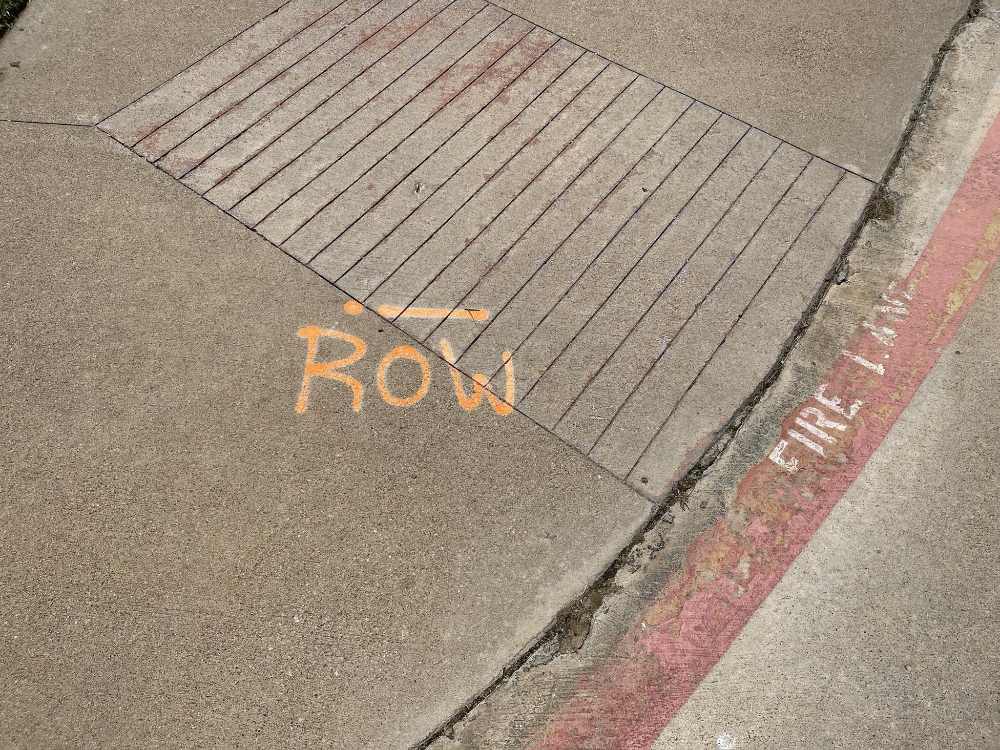

Question: Describe this image.
Ground Truth: A high angle view of an old faded street corner. In the middle of the view is the orange spray painted word "ROW", with a horizontal letter "i" placed above it. On the right side of the image is a partially visible and faded red line on the street corner with the words " FIRE LANE", heavily faded in white paint.
Moondream: An outdoor, close up, eye level view of a concrete sidewalk with a metal grate on the left side of the sidewalk. The metal grate has a black line going across the top of it. The top of the metal grate has the word "ROW" written on it in orange spray paint. To the right of the metal grate, there is a red line going across the sidewalk. The red line has the word "FIRE" written in white spray paint on it. To the left of the metal grate and the red line, there is a gray sidewalk.


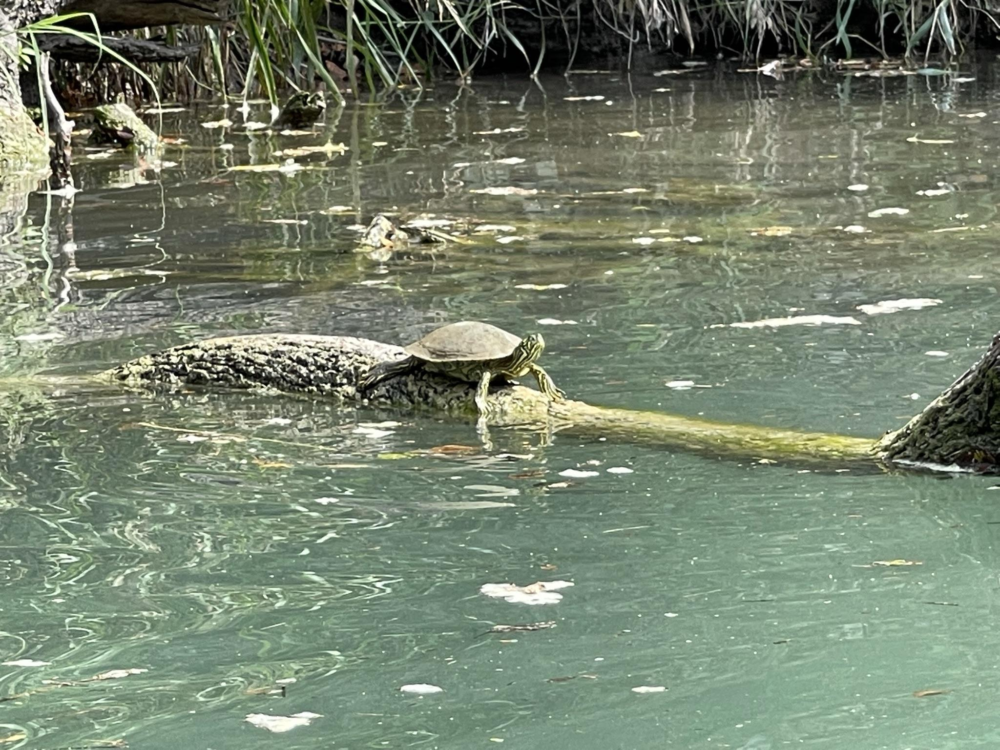

Question: Describe this image.
Ground Truth: An outdoor front view of a turtle that is sitting on a floating tree trunk that has moss growing at the front of it. The turtle is yellow and green and has a dark green shell. The turtle is pointing his head up and soaking up the sun. On the water, there are a couple pieces of foam floating in the swamp. In the far background, there are multiple dried pieces of grass. On the far left side of the swamp, there is a fallen tree trunk that has moss on it.
Moondream: An outdoor, close up, eye level view of a turtle in a body of water. The turtle is facing the left side of the image and is sitting on a log that is partially submerged in the water. The turtle's head is facing to the left, and its body is facing the right side of the image. The water is a light green color, and there are small ripples on the surface of the water. There is a reflection of the turtle and the log in the water, and there is a reflection of a tree trunk in the water on t

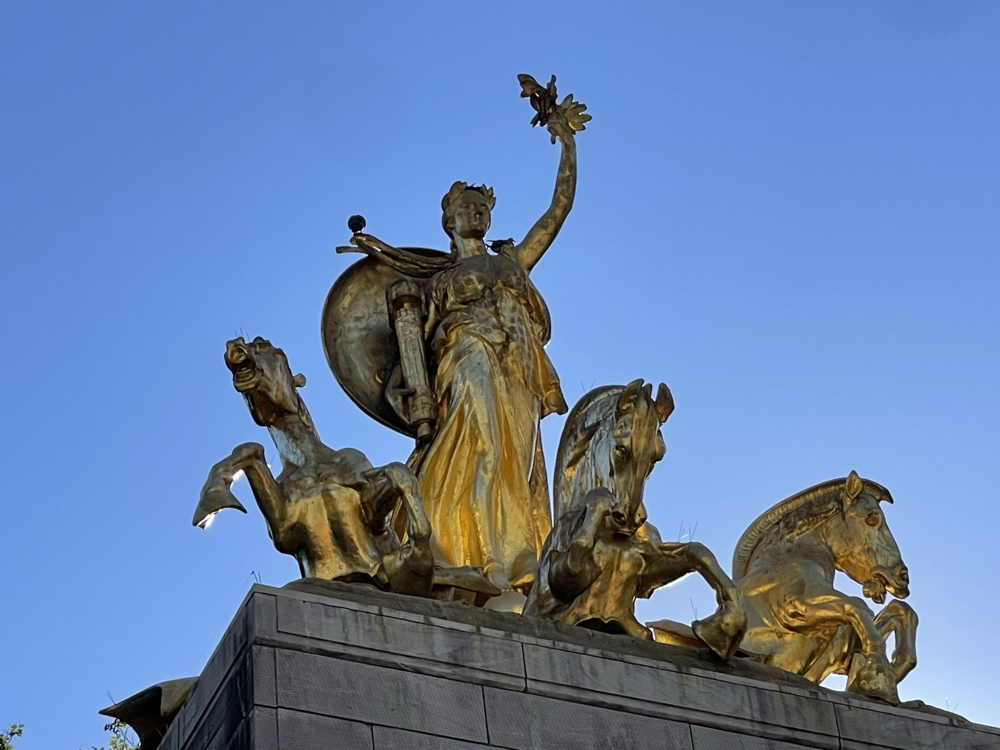

Question: Describe this image.
Ground Truth: An outdoor shot, looking up at the golden statue of a woman with three mythical seahorses sitting atop a gray brick monument. The woman is facing forward with her left arm raised up, holding a small leafy branch in her hand. She is holding a long cylinder vertically against her body with her right arm and has a large circular shield on her back. She has a leaf crown on her head with long braids that are visible flowing on the left side. The three mythical horses are spread evenly in front of her feet. The horse to the left has its mouth wide open. The horse in the middle has its chin resting on its chest. The horse on the right is a side view with the head facing the right and the mouth open. The legs are depicted as if they are moving. The background is a clear blue sky. Daytime.
Moondream: An outdoor, close up, eye level view of a statue of a woman standing on top of a stone platform. The woman is wearing a long dress and a crown on her he

In [ ]:
moondream.eval()

for i, sample in enumerate(datasets['test']):
    md_answer = moondream.answer_question(
        moondream.encode_image(sample['image']),
        sample['qa'][0]['question'],
        tokenizer=tokenizer,
        num_beams=4,
        no_repeat_ngram_size=5,
        early_stopping=True
    )

    if i < 3:
        display(sample['image'])
        print('Question:', sample['qa'][0]['question'])
        print('Ground Truth:', sample['qa'][0]['answer'])
        print('Moondream:', md_answer)
    else:
        break
